In [5]:
# the code is done using reference  from coursera sql practice 

In [2]:
import csv

In [3]:
import sqlite3

In [4]:
con = sqlite3.connect("superstoreData.db")   # creating a database connection using sqlite 
cur = con.cursor()   # started a cursor so that work in this database can be done

In [6]:
import pandas as pd

In [7]:
%load_ext sql

In [8]:
!pip install -q pandas==1.1.5

In [9]:
%sql sqlite:///SuperstoreData.db

In [10]:
import pandas
df = pandas.read_csv("Superstore_Dataset.csv", encoding='ISO-8859-1')
df.to_sql("Superstore_Data", con, if_exists='replace', index=False,method="multi")


C:\Users\My PC\anaconda3\lib\site-packages\pandas\core\generic.py:2605: UserWarning: The spaces in these column names will not be changed. In pandas versions < 0.14, spaces were converted to underscores.
  sql.to_sql(


## Getting information about table/dataset


In [11]:
%sql SELECT name FROM sqlite_master WHERE type='table';

 * sqlite:///SuperstoreData.db
Done.


name
new_superstore_table
Superstore_Data


In [12]:
%sql SELECT * FROM PRAGMA_TABLE_INFO('Superstore_DATA');

 * sqlite:///SuperstoreData.db
Done.


cid,name,type,notnull,dflt_value,pk
0,Row ID,INTEGER,0,None,0
1,Order ID,TEXT,0,None,0
2,Order Date,TEXT,0,None,0
3,Ship Date,TEXT,0,None,0
4,Ship Mode,TEXT,0,None,0
5,Customer ID,TEXT,0,None,0
6,Customer Name,TEXT,0,None,0
7,Segment,TEXT,0,None,0
8,Country,TEXT,0,None,0
9,City,TEXT,0,None,0


In [13]:
%sql SELECT count(name) FROM PRAGMA_TABLE_INFO('Superstore_Data');

 * sqlite:///SuperstoreData.db
Done.


count(name)
21


## removing duplicates from table


In [14]:
%sql select count(*) from Superstore_data;

 * sqlite:///SuperstoreData.db
Done.


count(*)
9994


In [15]:
%%sql 
CREATE TABLE new_superstore_table AS
SELECT DISTINCT * FROM Superstore_Data;


 * sqlite:///SuperstoreData.db
(sqlite3.OperationalError) table new_superstore_table already exists
[SQL: CREATE TABLE new_superstore_table AS
SELECT DISTINCT * FROM Superstore_Data;]
(Background on this error at: https://sqlalche.me/e/20/e3q8)


In [16]:
%sql select count(*) from new_Superstore_table;

 * sqlite:///SuperstoreData.db
Done.


count(*)
9994


## Adding month and year column using order date 

In [17]:
%sql select count(*) from new_Superstore_table;

 * sqlite:///SuperstoreData.db
Done.


count(*)
9994


In [18]:
%%sql
-- Add new columns for day, month, and year
ALTER TABLE new_Superstore_table
ADD COLUMN day INTEGER;

ALTER TABLE new_Superstore_table
ADD COLUMN month INTEGER;

ALTER TABLE new_Superstore_table
ADD COLUMN year INTEGER;



 * sqlite:///SuperstoreData.db
(sqlite3.OperationalError) duplicate column name: day
[SQL: -- Add new columns for day, month, and year
ALTER TABLE new_Superstore_table
ADD COLUMN day INTEGER;]
(Background on this error at: https://sqlalche.me/e/20/e3q8)


In [19]:
%%sql
-- Update the new columns with day, month, and year values
UPDATE new_Superstore_table
SET 
    
    year = CAST(substr("Order Date", -4) AS INTEGER);

 * sqlite:///SuperstoreData.db
Done.


[]

In [20]:
%%sql
-- Update the new columns with day, month, and year values
UPDATE new_Superstore_table
SET 
    
    month = CAST(substr(replace("Order Date", '/', ' '), 1, 2) AS INTEGER);

 * sqlite:///SuperstoreData.db
Done.


[]

In [21]:
%%sql 
select * from new_Superstore_table


 * sqlite:///SuperstoreData.db
Done.


Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,day,month,year
1,CA-2016-152156,11/8/2016,11/11/2016,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.96,2,0.0,41.9136,None,11,2016
2,CA-2016-152156,11/8/2016,11/11/2016,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs, Rounded Back",731.94,3,0.0,219.582,None,11,2016
3,CA-2016-138688,6/12/2016,6/16/2016,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters by Universal,14.62,2,0.0,6.8714,None,6,2016
4,US-2015-108966,10/11/2015,10/18/2015,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.031,None,10,2015
5,US-2015-108966,10/11/2015,10/18/2015,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.368000000000002,2,0.2,2.5164,None,10,2015
6,CA-2014-115812,6/9/2014,6/14/2014,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,FUR-FU-10001487,Furniture,Furnishings,"Eldon Expressions Wood and Plastic Desk Accessories, Cherry Wood",48.86,7,0.0,14.1694,None,6,2014
7,CA-2014-115812,6/9/2014,6/14/2014,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,OFF-AR-10002833,Office Supplies,Art,Newell 322,7.28,4,0.0,1.9656,None,6,2014
8,CA-2014-115812,6/9/2014,6/14/2014,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,TEC-PH-10002275,Technology,Phones,Mitel 5320 IP Phone VoIP phone,907.1519999999999,6,0.2,90.7152,None,6,2014
9,CA-2014-115812,6/9/2014,6/14/2014,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,OFF-BI-10003910,Office Supplies,Binders,DXL Angle-View Binders with Locking Rings by Samsill,18.504,3,0.2,5.7825,None,6,2014
10,CA-2014-115812,6/9/2014,6/14/2014,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,OFF-AP-10002892,Office Supplies,Appliances,Belkin F5C206VTEL 6 Outlet Surge,114.9,5,0.0,34.47,None,6,2014


## Extracting and Visualising data

In [22]:
%%sql
select year , sum(sales) from new_Superstore_table group by year;
select year , month , sum(sales) from new_Superstore_table group by year , month;

 * sqlite:///SuperstoreData.db
Done.
Done.


year,month,sum(sales)
2014,1,14236.894999999997
2014,2,4519.892
2014,3,55691.00900000003
2014,4,28295.344999999994
2014,5,23648.287
2014,6,34595.12760000003
2014,7,33946.39299999999
2014,8,27909.46849999999
2014,9,81777.35079999997
2014,10,31453.39299999999


In [23]:
!pip install seaborn
import seaborn as sns

## Monthly Sales Trend

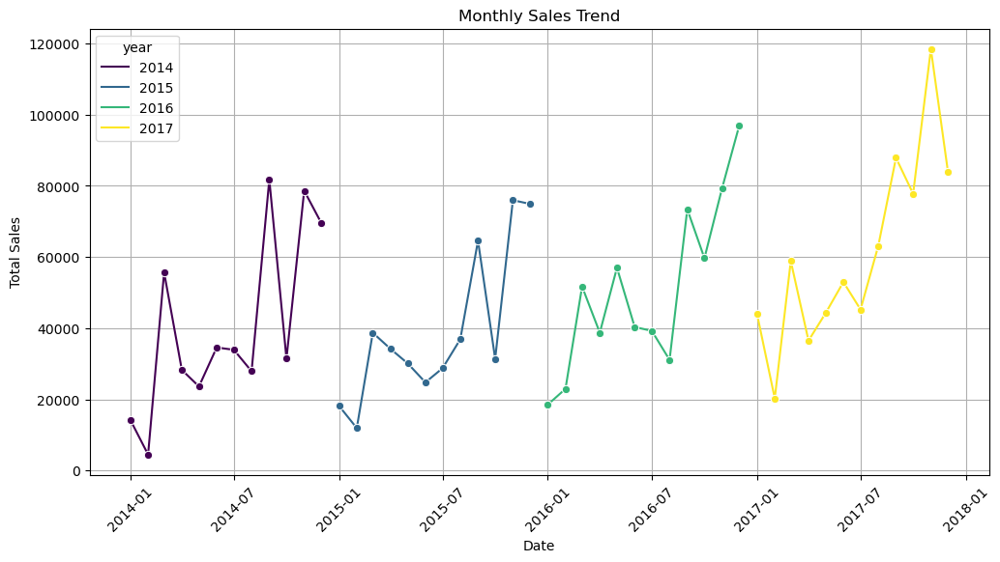

In [24]:

import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('SuperstoreData.db')  # Adjust the database name if needed

# Execute the SQL query
query = '''
SELECT year, month, SUM(sales) as total_sales
FROM new_Superstore_table
GROUP BY year, month;
'''
result = pd.read_sql_query(query, conn)

# Close the database connection
conn.close()
result['date'] = pd.to_datetime(result[['year', 'month']].assign(day=1))

# Plotting using Seaborn
plt.figure(figsize=(12, 6))
sns.lineplot(data=result, x='date', y='total_sales', hue='year', marker='o', palette='viridis')
plt.title('Monthly Sales Trend')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


### Sales by Category


In [25]:
%%sql 
select category, sum(sales) as total_sales from new_superstore_table group by category order by total_sales;

 * sqlite:///SuperstoreData.db
Done.


Category,total_sales
Office Supplies,719047.0320000029
Furniture,741999.7952999998
Technology,836154.0329999966


In [33]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns  # Don't forget to import seaborn

# Connect to the SQLite database
conn = sqlite3.connect('SuperstoreData.db')  # Adjust the database name if needed

# Execute the SQL query
query = '''
SELECT category, SUM(sales) AS total_sales
FROM new_superstore_table
GROUP BY category
ORDER BY total_sales;
'''
result = pd.read_sql_query(query, conn)
print(result.columns)



Index(['Category', 'total_sales'], dtype='object')


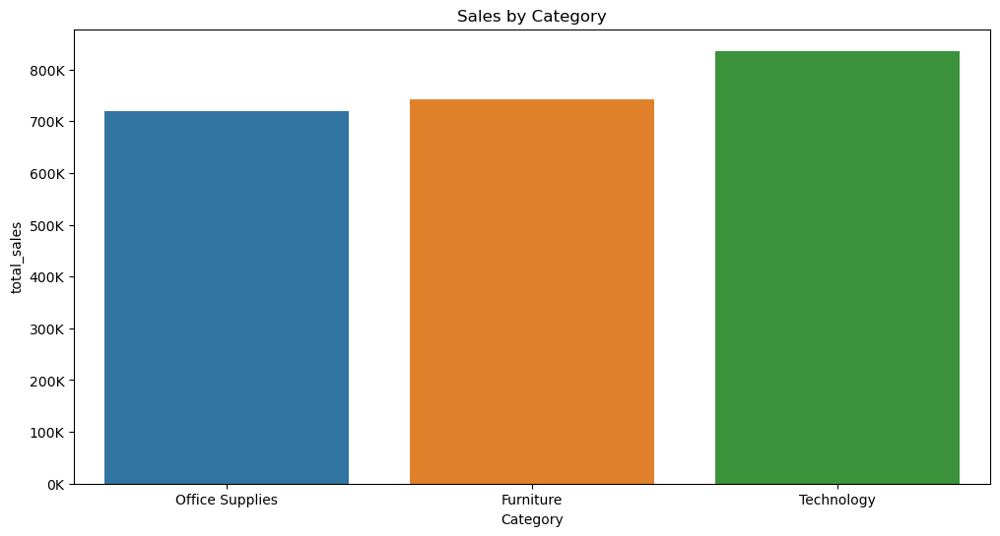

In [36]:
# Close the database connection
conn.close()
from matplotlib.ticker import FuncFormatter
# Plotting using Seaborn
plt.figure(figsize=(12, 6))
ax = sns.barplot(data=result, x='Category', y='total_sales')  # Make sure column names match the case
plt.title('Sales by Category')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}K'.format(x / 1000)))

plt.show()

### Sales by Region


    Region  total_sales
0    South  391721.9050
1  Central  501239.8908
2     East  678781.2400
3     West  725457.8245
Index(['Region', 'total_sales'], dtype='object')


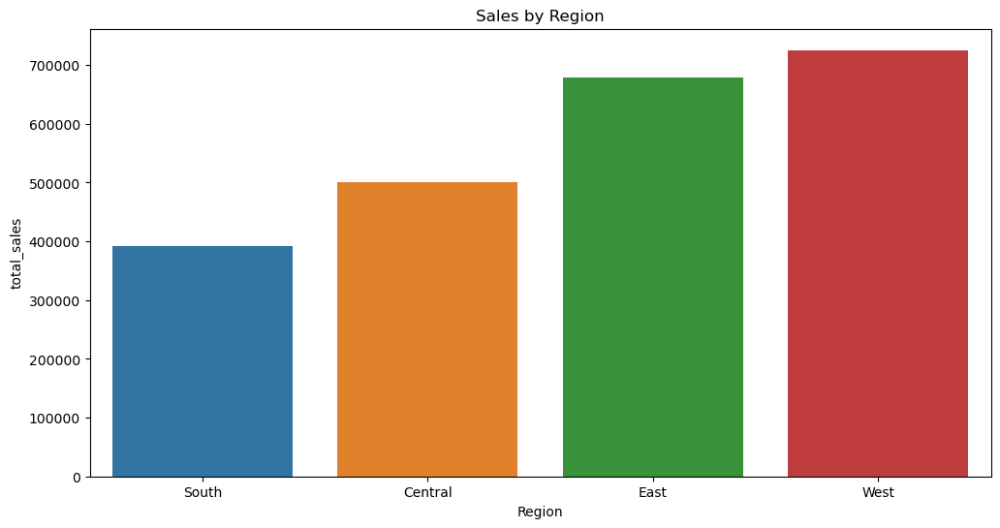

In [76]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns  # Don't forget to import seaborn

# Connect to the SQLite database
conn = sqlite3.connect('SuperstoreData.db')  # Adjust the database name if needed

# Execute the SQL query
query = '''
SELECT region, SUM(sales) AS total_sales
FROM new_superstore_table
GROUP BY region
ORDER BY total_sales;
'''
result = pd.read_sql_query(query, conn)
print(result)
print(result.columns)

# Close the database connection
conn.close()
from matplotlib.ticker import FuncFormatter
# Plotting using Seaborn
plt.figure(figsize=(12, 6))
ax = sns.barplot(data=result, x='Region', y='total_sales')  # Make sure column names match the case
plt.title('Sales by Region')
plt.show()

### Sales by sub-category


   Sub-Category  total_sales
0     Fasteners    3024.2800
1        Labels   12486.3120
2     Envelopes   16476.4020
3           Art   27118.7920
4      Supplies   46673.5380
5         Paper   78479.2060
6   Furnishings   91705.1640
7    Appliances  107532.1610
8     Bookcases  114879.9963
9       Copiers  149528.0300
10  Accessories  167380.3180
11     Machines  189238.6310
12      Binders  203412.7330
13       Tables  206965.5320
14      Storage  223843.6080
15       Chairs  328449.1030
16       Phones  330007.0540
Index(['Sub-Category', 'total_sales'], dtype='object')


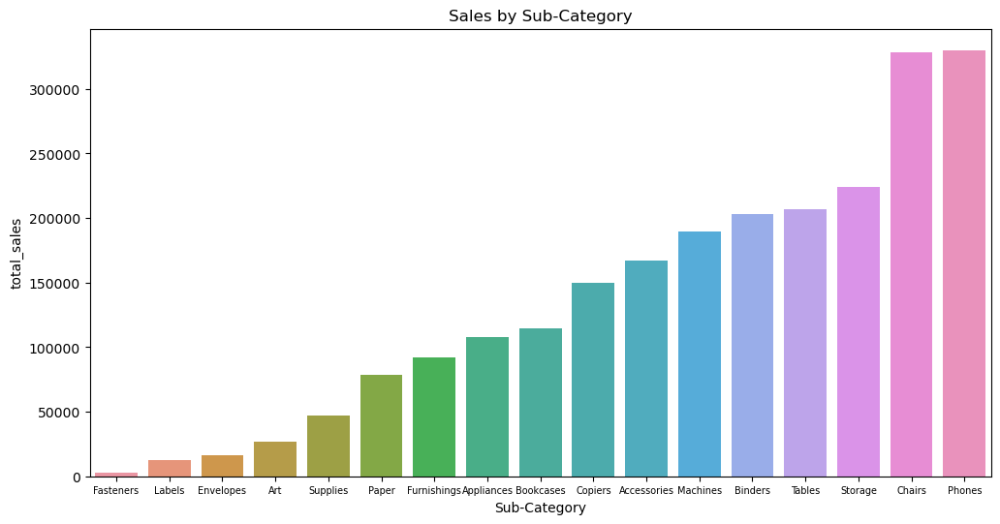

In [77]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns  # Don't forget to import seaborn

# Connect to the SQLite database
conn = sqlite3.connect('SuperstoreData.db')  # Adjust the database name if needed

# Execute the SQL query
query = '''
SELECT "sub-category", SUM(sales) AS total_sales
FROM new_superstore_table
GROUP BY "sub-category"
ORDER BY total_sales;
'''
result = pd.read_sql_query(query, conn)
print(result)
print(result.columns)

# Close the database connection
conn.close()
from matplotlib.ticker import FuncFormatter
# Plotting using Seaborn
plt.figure(figsize=(12, 6))
ax = sns.barplot(data=result, x='Sub-Category', y='total_sales')  # Make sure column names match the case
plt.title('Sales by Sub-Category')
plt.xticks(fontsize=7)

plt.show()

In [ ]:
# Monthly Profit trend
profit_by_month = data.groupby(['Order Year', 'Order Month'])['Profit'].sum().reset_index()

plt.figure(figsize=(12,6))
sns.lineplot(data=profit_by_month, x='Order Month', y='Profit', hue='Order Year')
plt.title('Montly Profit Trend')
plt.show()

    year  month  total_profit
0   2014      1     2450.1907
1   2014      2      862.3084
2   2014      3      498.7299
3   2014      4     3488.8352
4   2014      5     2738.7096
5   2014      6     4976.5244
6   2014      7     -841.4826
7   2014      8     5318.1050
8   2014      9     8328.0994
9   2014     10     3448.2573
10  2014     11     9292.1269
11  2014     12     8983.5699
12  2015      1    -3281.0070
13  2015      2     2813.8508
14  2015      3     9732.0978
15  2015      4     4187.4962
16  2015      5     4667.8690
17  2015      6     3335.5572
18  2015      7     3288.6483
19  2015      8     5355.8084
20  2015      9     8209.1627
21  2015     10     2817.3660
22  2015     11    12474.7884
23  2015     12     8016.9659
24  2016      1     2824.8233
25  2016      2     5004.5795
26  2016      3     3611.9680
27  2016      4     2977.8149
28  2016      5     8662.1464
29  2016      6     4750.3781
30  2016      7     4432.8779
31  2016      8     2062.0693
32  2016  

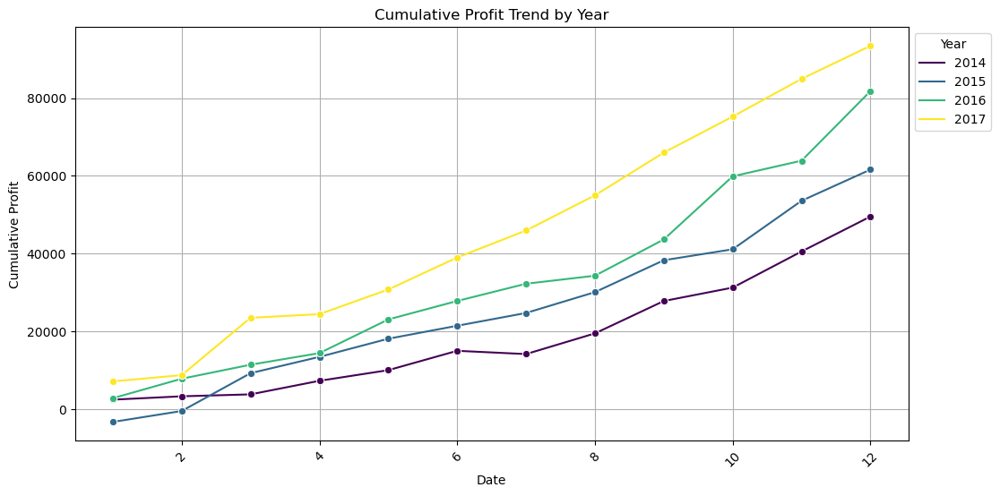

In [58]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns  # Don't forget to import seaborn

# Connect to the SQLite database
conn = sqlite3.connect('SuperstoreData.db')  # Adjust the database name if needed

# Execute the SQL query
query = '''
SELECT year,month, SUM(profit) AS total_profit
FROM new_superstore_table
GROUP BY year,month
ORDER BY year,month;
'''
result = pd.read_sql_query(query, conn)
print(result)
print(result.columns)

# Close the database connection
conn.close()
result['date'] = pd.to_datetime(result[['year', 'month']].assign(day=1))

result['cumulative_profit'] = result.groupby('year')['total_profit'].cumsum()

# Plotting using Seaborn
plt.figure(figsize=(12, 6))
sns.lineplot(data=result, x='month', y='cumulative_profit', hue='year', marker='o', palette='viridis')
plt.title('Cumulative Profit Trend by Year')
plt.xlabel('Date')
plt.ylabel('Cumulative Profit')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend(title='Year', loc='upper left', bbox_to_anchor=(1, 1))

plt.show()

### Profit by category

Index(['Category', 'total_profit'], dtype='object')


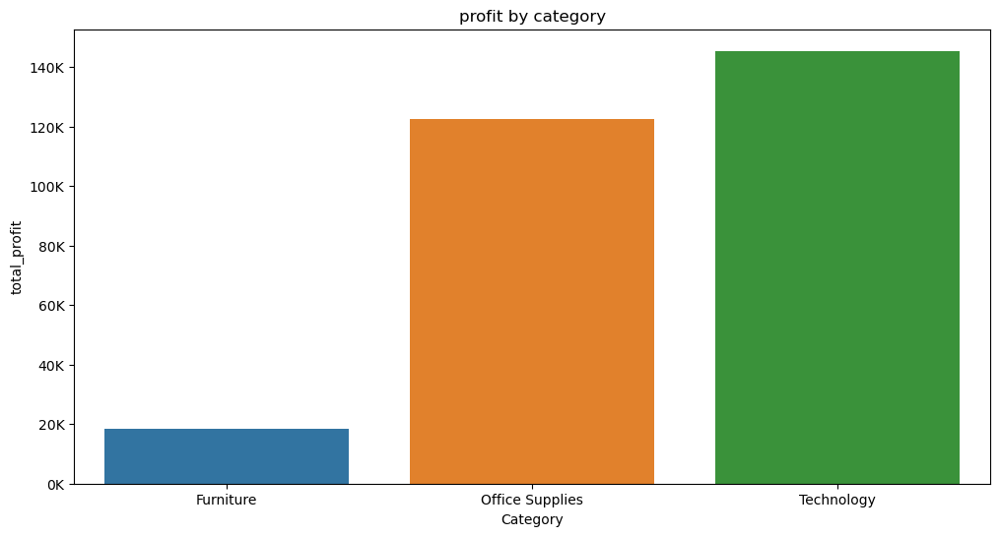

In [61]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns  # Don't forget to import seaborn

# Connect to the SQLite database
conn = sqlite3.connect('SuperstoreData.db')  # Adjust the database name if needed

# Execute the SQL query
query = '''
SELECT category, SUM(profit) AS total_profit
FROM new_superstore_table
GROUP BY category
ORDER BY total_profit;
'''
result = pd.read_sql_query(query, conn)
print(result.columns)
# Close the database connection
conn.close()
from matplotlib.ticker import FuncFormatter
# Plotting using Seaborn
plt.figure(figsize=(12, 6))
ax = sns.barplot(data=result, x='Category', y='total_profit')  # Make sure column names match the case
plt.title('profit by category')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}K'.format(x / 1000)))

plt.show()

### Profit by sub category

   Sub-Category  total_profit
0        Tables   -17725.4811
1     Bookcases    -3472.5560
2      Supplies    -1189.0995
3     Fasteners      949.5182
4      Machines     3384.7569
5        Labels     5546.2540
6           Art     6527.7870
7     Envelopes     6964.1767
8   Furnishings    13059.1436
9    Appliances    18138.0054
10      Storage    21278.8264
11       Chairs    26590.1663
12      Binders    30221.7633
13        Paper    34053.5693
14  Accessories    41936.6357
15       Phones    44515.7306
16      Copiers    55617.8249
Index(['Sub-Category', 'total_profit'], dtype='object')


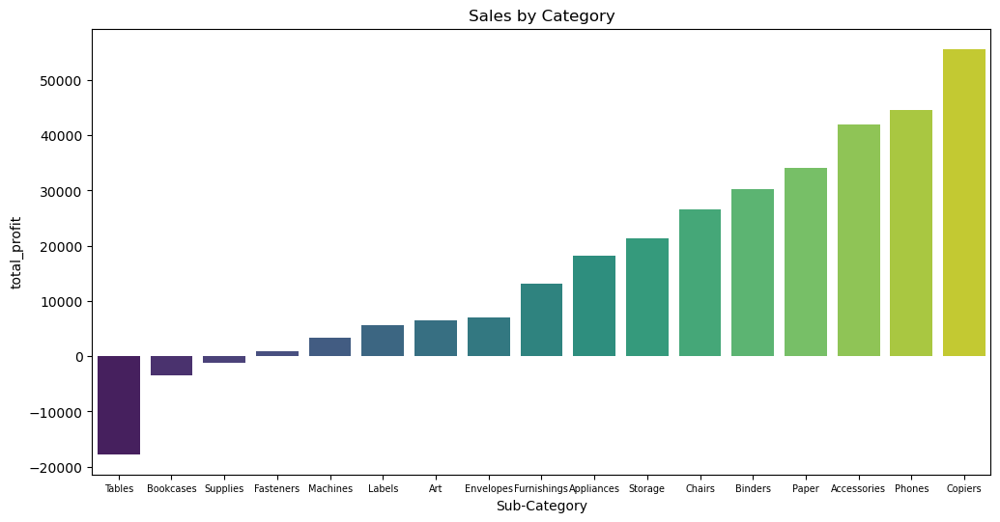

In [74]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns  # Don't forget to import seaborn

# Connect to the SQLite database
conn = sqlite3.connect('SuperstoreData.db')  # Adjust the database name if needed

# Execute the SQL query
query = '''
SELECT "sub-category", SUM(profit) AS total_profit
FROM new_superstore_table
GROUP BY "sub-category"
ORDER BY total_profit;
'''
result = pd.read_sql_query(query, conn)
print(result)
print(result.columns)

# Close the database connection

conn.close()
plt.figure(figsize=(12, 6))
ax = sns.barplot(data=result, x='Sub-Category', y='total_profit', palette='viridis')

plt.title('Sales by Category')
plt.xticks(fontsize=7)

plt.show()



### Profit by region

    Region  total_profit
0  Central    39706.3625
1    South    46749.4303
2     East    91522.7800
3     West   108418.4489
Index(['Region', 'total_profit'], dtype='object')


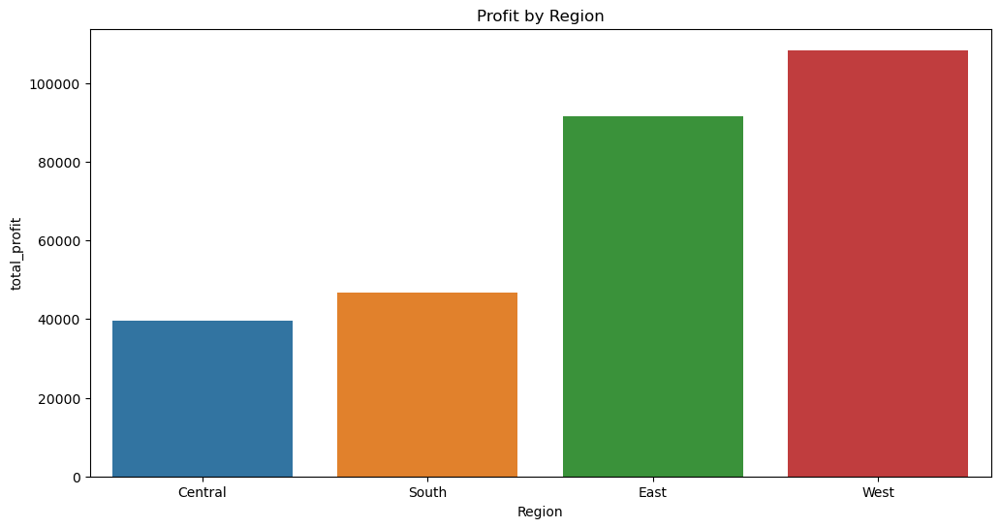

In [62]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns  # Don't forget to import seaborn

# Connect to the SQLite database
conn = sqlite3.connect('SuperstoreData.db')  # Adjust the database name if needed

# Execute the SQL query
query = '''
SELECT region, SUM(profit) AS total_profit
FROM new_superstore_table
GROUP BY region
ORDER BY total_profit;
'''
result = pd.read_sql_query(query, conn)
print(result)
print(result.columns)

# Close the database connection
conn.close()
from matplotlib.ticker import FuncFormatter
# Plotting using Seaborn
plt.figure(figsize=(12, 6))
ax = sns.barplot(data=result, x='Region', y='total_profit')  # Make sure column names match the case
plt.title('Profit by Region')
plt.show()